# TODO:
1. ~~check what makes the difference between earlier implementation and this implementation. (a) increased permutation (b) subtracting the mean (c) homologs as background permutations~~
4. ~~new data, droplet / human lung atlas~~
5. Downstream applications (a) find interesting patterns ~~(b) cross trait TRS correlation~~ (c) correlated genes. 
6. Re-evaluate genesets
7. Question: how does FDR cope with correlated p-values?
8. Analytical solution of mean and std of per-cell ctrl TRS


In [1]:
# autoreload
%load_ext autoreload
%autoreload 2

import scTRS.method_simple as simple_md
import scTRS.util as util
import scTRS.method as md
import scTRS.data_loader as dl
import submitit
import numpy as np

import pandas as pd
import os
from os.path import join
import itertools
import pickle
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt

executor = submitit.AutoExecutor(folder="~/submitit_log/")

# constants
DATA_PATH = '/n/holystore01/LABS/price_lab/Users/mjzhang/scTRS_data'
GENE_SCORE_PATH = join(DATA_PATH, 'trs_gene_scores')
hsapiens_mmusculus_mapping = pd.read_csv(join(GENE_SCORE_PATH, 'meta_data', 'hsapiens_mmusculus_mapping.csv'))

In [2]:
np.random.seed(1234)
score_dataset = simple_md.load_score_dataset('tms_droplet')
md.compute_stats(score_dataset)


gene_set_dict = dict()

# real traits
trait_list = ['PASS_Schizophrenia_Ruderfer2018',
              'PASS_BipolarDisorder_Ruderfer2018',
              'PASS_Alzheimers_Jansen2019', 
              'PASS_AdultOnsetAsthma_Ferreira2019',
              'PASS_Coronary_Artery_Disease', 
              'PASS_LargeArteryStroke_Malik2018', 
              'PASS_HDL', 'PASS_LDL',
              'PASS_Rheumatoid_Arthritis', 'PASS_Lupus', 
              'PASS_FastingGlucose_Manning',
              'PASS_IBD_deLange2017', 
              'PASS_Type_1_Diabetes', 
              'PASS_Type_2_Diabetes']

            
for trait in trait_list:
    # trait gene set
    trait_gene_df = simple_md.load_gene_score(path=join(GENE_SCORE_PATH, 'gwas_max_abs_z', f'{trait}.csv'),
                     gene_id_col='GENE',
                     score_col='MAX_ABS_Z',
                     ascending=False,
                     num_genes=500,
                     hsapiens_mmusculus_mapping=hsapiens_mmusculus_mapping)

    gene_set_dict[trait] = np.unique(trait_gene_df.GENE.values)

# simulation, random traits
for sim_i in range(30):
    gene_set_dict[f'random_{sim_i}'] = np.unique(list(np.random.choice(score_dataset.var_names, size=500, replace=False)))

for name in gene_set_dict:
    gene_set_dict[name] = list(set(gene_set_dict[name]) & set(score_dataset.var_names))
    

In [3]:
experiment_dir = "/n/home12/khou/scTRS_results/121320_simple_score_tms_droplet/"
def param2prefix(param):
    return '.'.join([str(p) for p in param])

def wrapper(gene_list, num_ctrl, out):
    rls = simple_md.score_cell(dataset='tms_droplet', gene_list=gene_list, num_ctrl = num_ctrl)
    with open(out, 'wb') as f:
        pickle.dump(rls, f)    

if not os.path.exists(experiment_dir):
    os.makedirs(experiment_dir)

param_list = [param for param in itertools.product(list(gene_set_dict.keys()), [100, 500])]
todo_param_list = [param for param in param_list if not os.path.exists(join(experiment_dir, param2prefix(param) + '.pkl'))]

executor.update_parameters(timeout_min=45, mem_gb=32, slurm_partition="serial_requeue")
job_dict = {param: executor.submit(wrapper, gene_set_dict[param[0]], param[1], join(experiment_dir, param2prefix(param) + '.pkl')) 
            for param in todo_param_list}

In [4]:
# Collect all the results
result_dict = {}
for param in param_list:
    path = join(experiment_dir, param2prefix(param) + '.pkl')
    if os.path.exists(path):
        with open(path, 'rb') as f:
            result_dict[param] = pickle.load(f)
    else:
        print(f'{path} does not exist')

# Simulation analysis

## Distribution of histograms

## ('pval', 100)

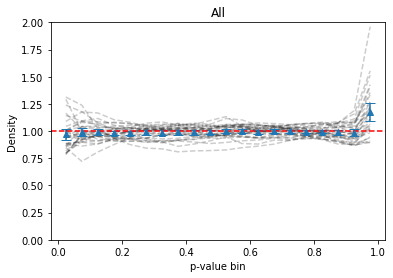

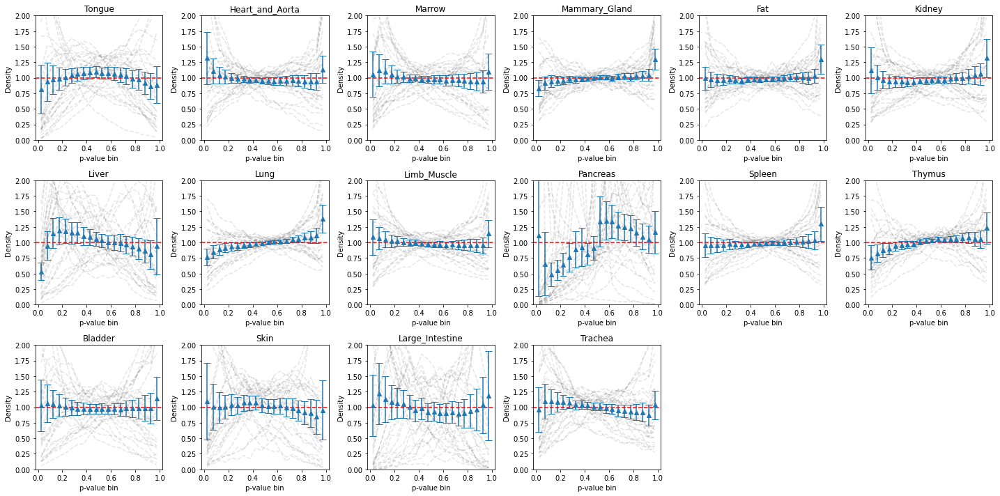

## ('pval', 500)

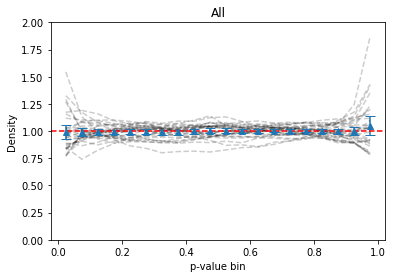

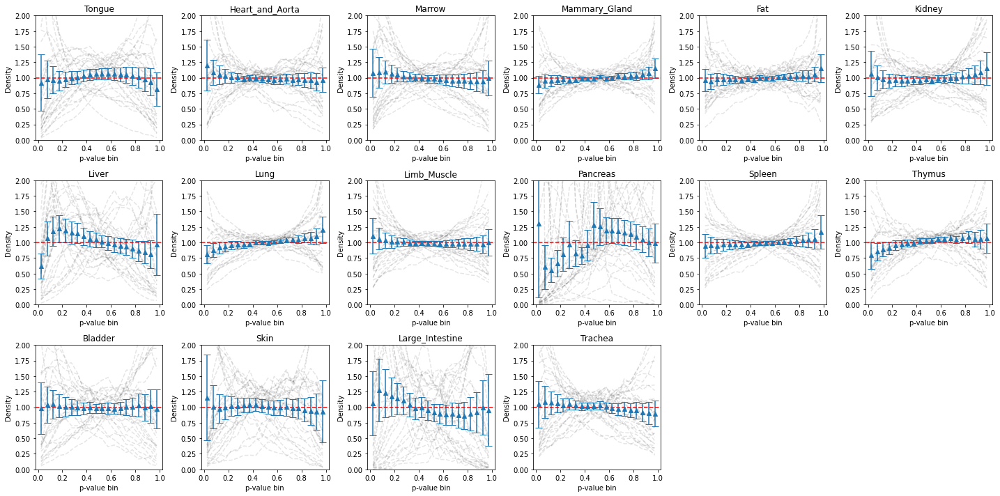

## ('trait_ep', 100)

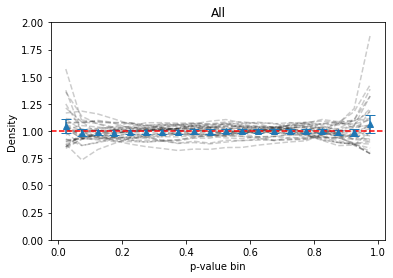

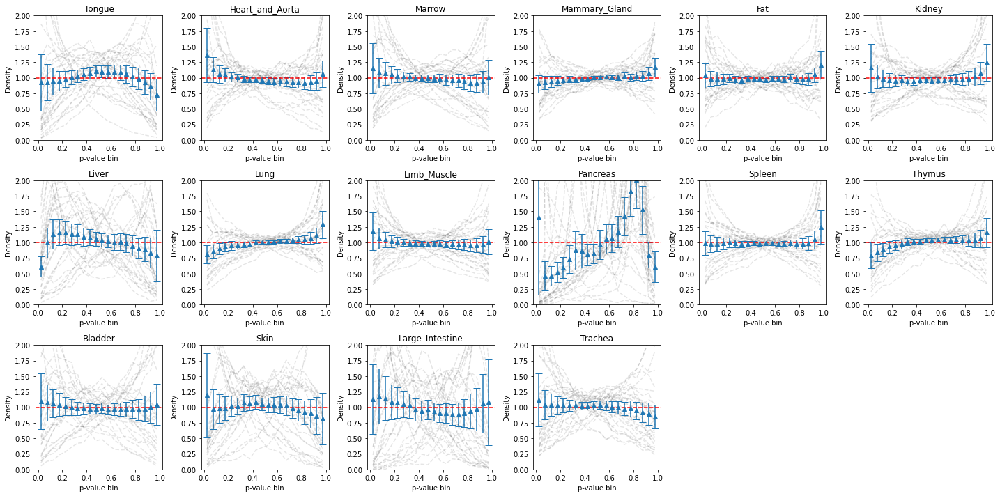

## ('trait_ep', 500)

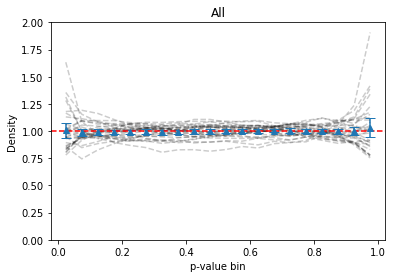

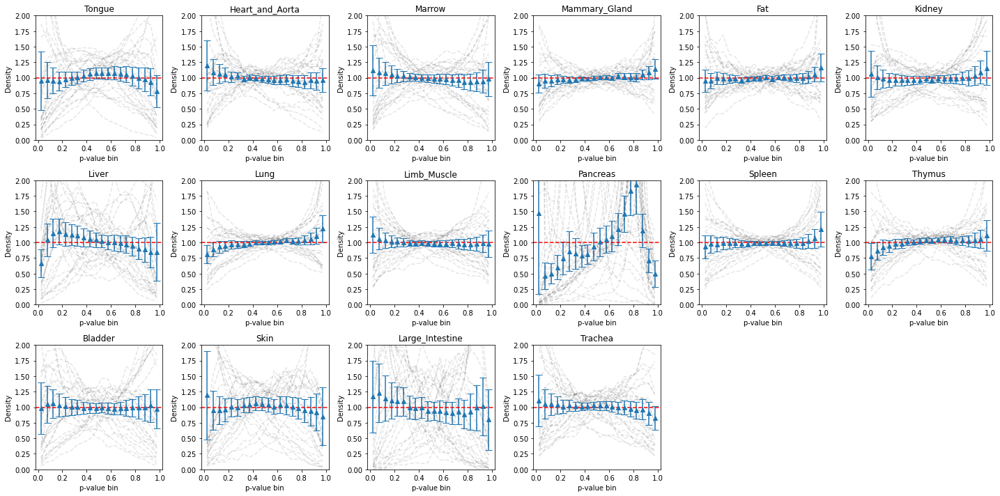

## ('within_tissue_trait_ep', 100)

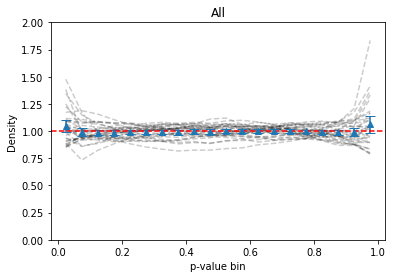

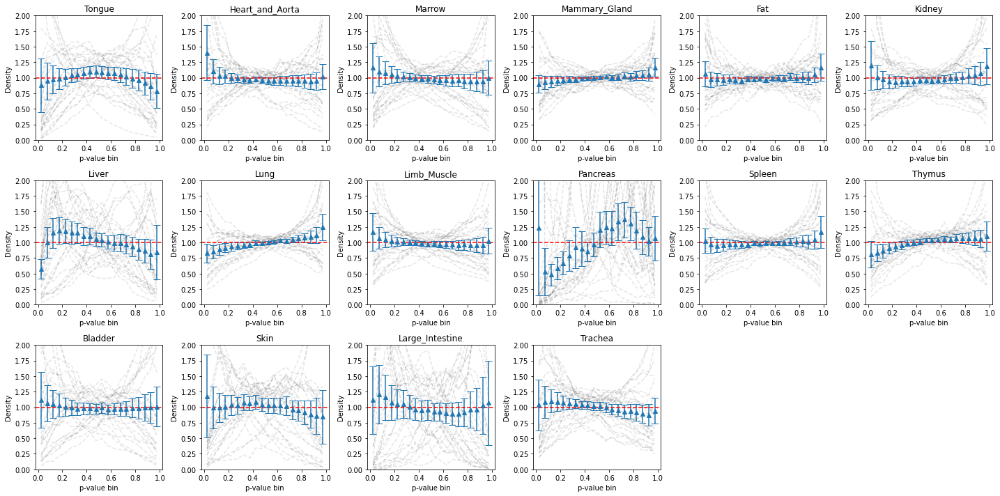

## ('within_tissue_trait_ep', 500)

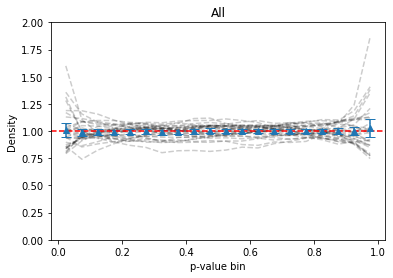

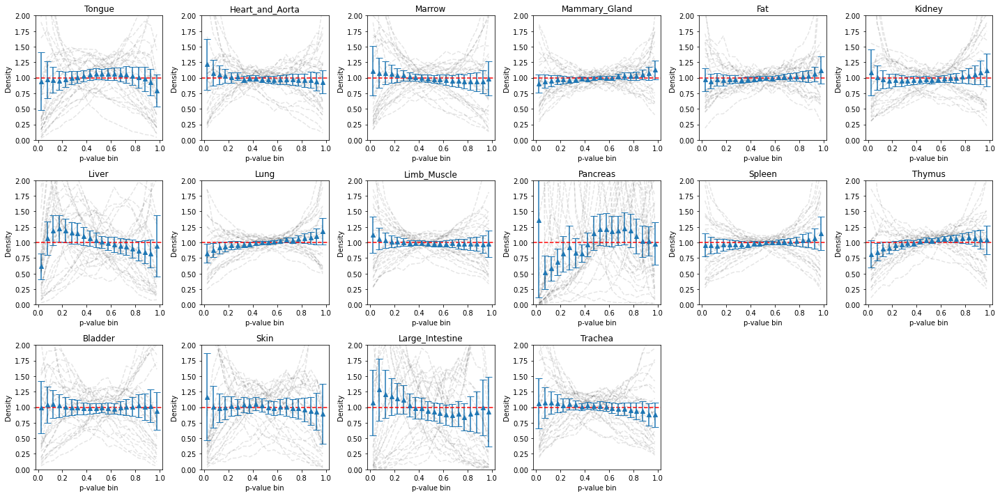

In [5]:
random_trait_names = [f'random_{i}' for i in range(30)]
# for trait_ep_name in ['pval', 'trait_ep', 'normal_trait_ep', 'robust_trait_ep']:
score_index = result_dict[('random_0', 100)]['index']
for trait_ep_name in ['pval', 'trait_ep', 'within_tissue_trait_ep']:
    for num_ctrl in [100, 500]:
        display(Markdown(f'## {trait_ep_name, num_ctrl}'))
        score_list = [result_dict[(trait, num_ctrl)][trait_ep_name] for trait in random_trait_names]
         # extract index from one of the simulation, all simulation index stays the same
        simple_md.plot_simulation_score_hist(score_list, score_index, score_dataset)

## p-value calibration

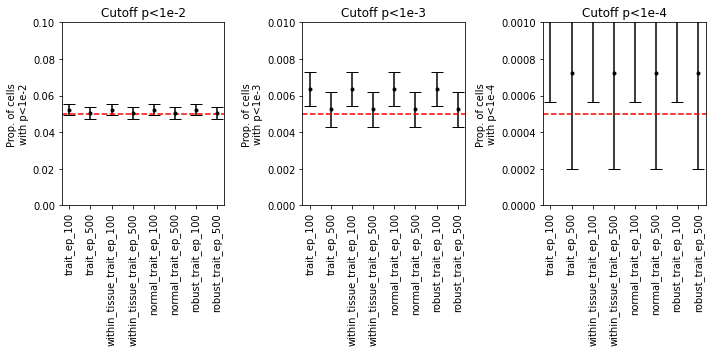

In [6]:
pval_dict = dict()
for name in ['trait_ep', 'within_tissue_trait_ep', 'normal_trait_ep', 'robust_trait_ep']:
    for num_ctrl in [100, 500]:
        pval_dict[f'{name}_{num_ctrl}'] = [result_dict[(trait, num_ctrl)][trait_ep_name] for trait in random_trait_names]
simple_md.plot_simulation_pval_calibration(pval_dict)

# Real data analysis

## Association matrix and QQ plot

### trait_ep, 500

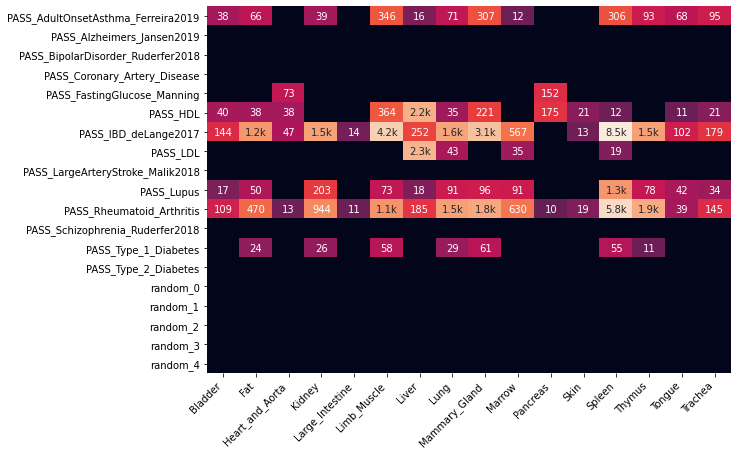

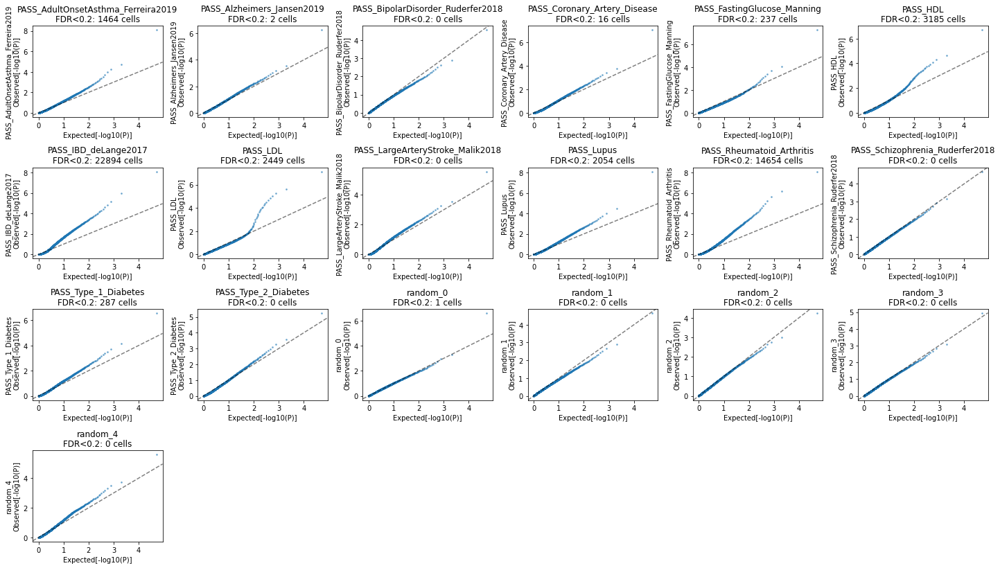

### within_tissue_trait_ep, 500

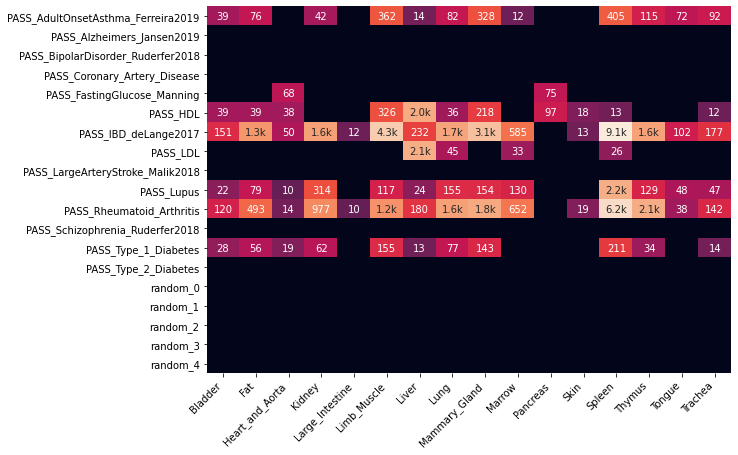

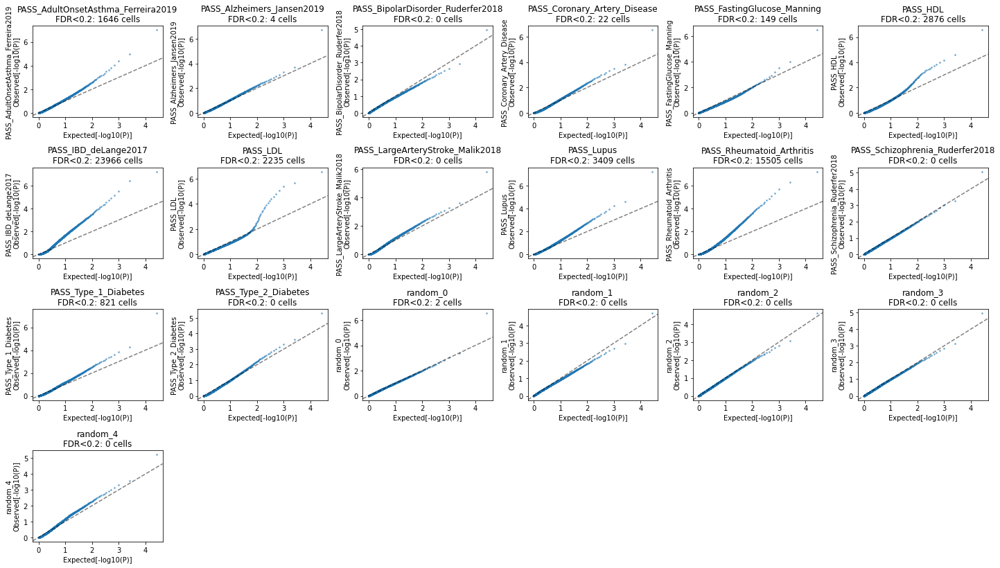

### normal_trait_ep, 500

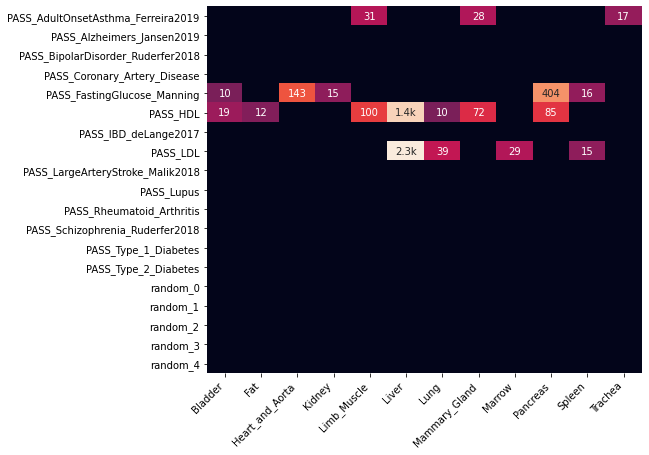

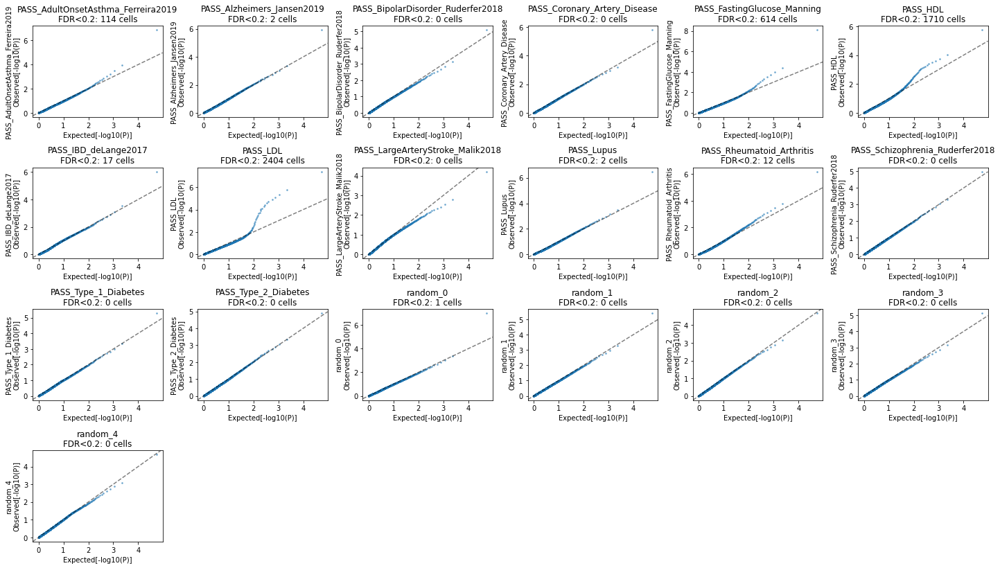

In [7]:
real_trait_names = list(np.unique([trait[0] for trait in result_dict.keys() if not trait[0].startswith('random')]))
score_index = result_dict[('random_0', 100)]['index']

for opt in ['trait_ep', 'within_tissue_trait_ep', 'normal_trait_ep']:
    for num_ctrl in [500]:
        display(Markdown(f'### {opt}, {num_ctrl}'))
        pval_dict = {trait: result_dict[(trait, num_ctrl)][opt] for trait in [*real_trait_names, *[f'random_{i}' for i in range(5)] ]}
        simple_md.plot_assoc_matrix(pval_dict, score_index, score_dataset, stratify_by='tissue')
        simple_md.plot_qqplot(pval_dict, num_cols=6)

## p-value UMAP

In [8]:
# load data
umap_tissue_list = ['Marrow', 'Thymus', 'Spleen', 'Pancreas', 'Liver']
umap_adata_dict = {tissue: dl.load_tms_processed(DATA_PATH, data_name='droplet', tissue=tissue)[tissue] for tissue in umap_tissue_list}

# load_tms_processed: load droplet data, tissue=[Bladder, Fat, Heart_and_Aorta, Kidney, Large_Intestine, Limb_Muscle, Liver, Lung, Mammary_Gland, Marrow, Pancreas, Skin, Spleen, Thymus, Tongue, Trachea]
# load_tms_processed: load droplet data, tissue=[Bladder, Fat, Heart_and_Aorta, Kidney, Large_Intestine, Limb_Muscle, Liver, Lung, Mammary_Gland, Marrow, Pancreas, Skin, Spleen, Thymus, Tongue, Trachea]
# load_tms_processed: load droplet data, tissue=[Bladder, Fat, Heart_and_Aorta, Kidney, Large_Intestine, Limb_Muscle, Liver, Lung, Mammary_Gland, Marrow, Pancreas, Skin, Spleen, Thymus, Tongue, Trachea]
# load_tms_processed: load droplet data, tissue=[Bladder, Fat, Heart_and_Aorta, Kidney, Large_Intestine, Limb_Muscle, Liver, Lung, Mammary_Gland, Marrow, Pancreas, Skin, Spleen, Thymus, Tongue, Trachea]
# load_tms_processed: load droplet data, tissue=[Bladder, Fat, Heart_and_Aorta, Kidney, Large_Intestine, Limb_Muscle, Liver, Lung, Mammary_Gland, Marrow, Pancreas, Skin, Spleen, Thymus, To

### trait_ep, 500

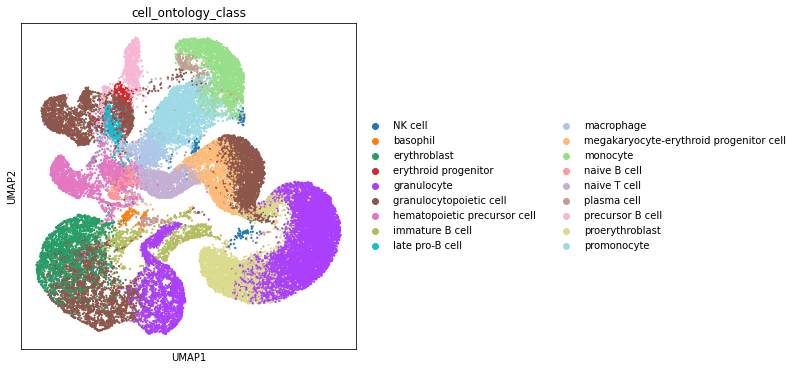

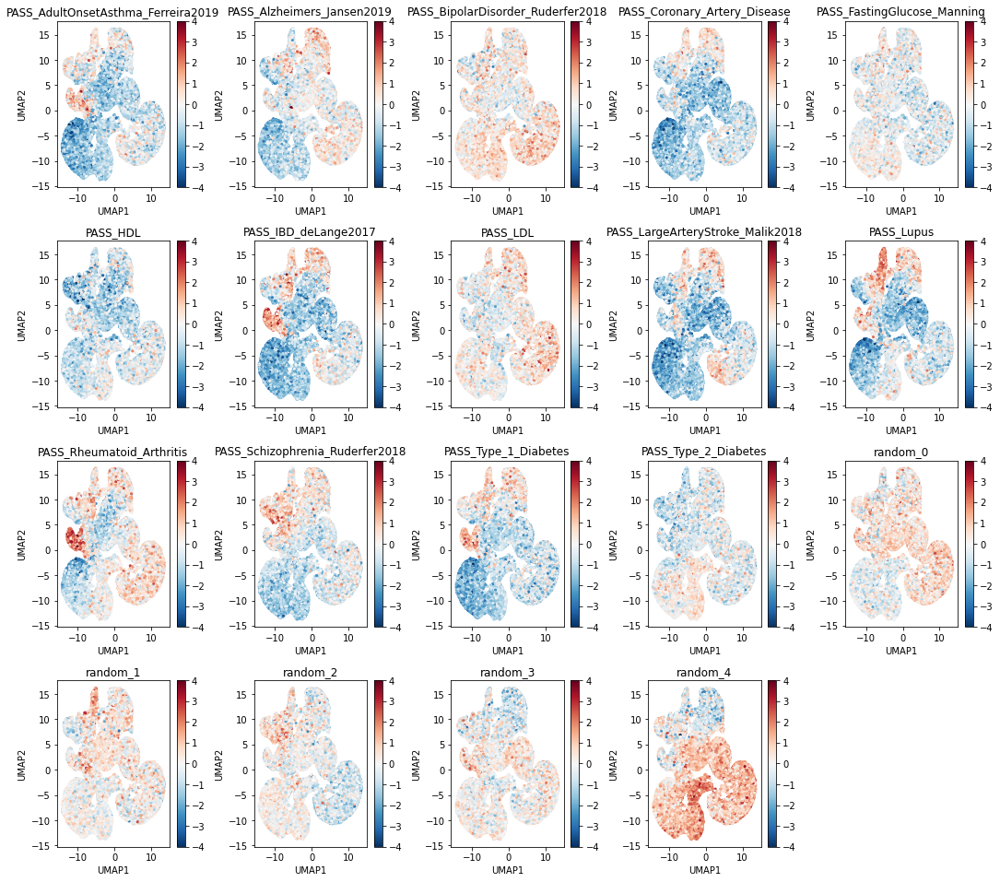

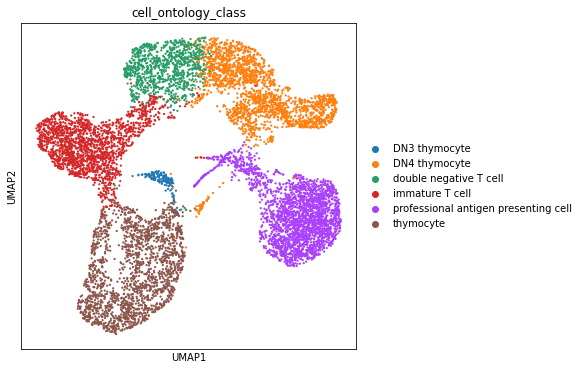

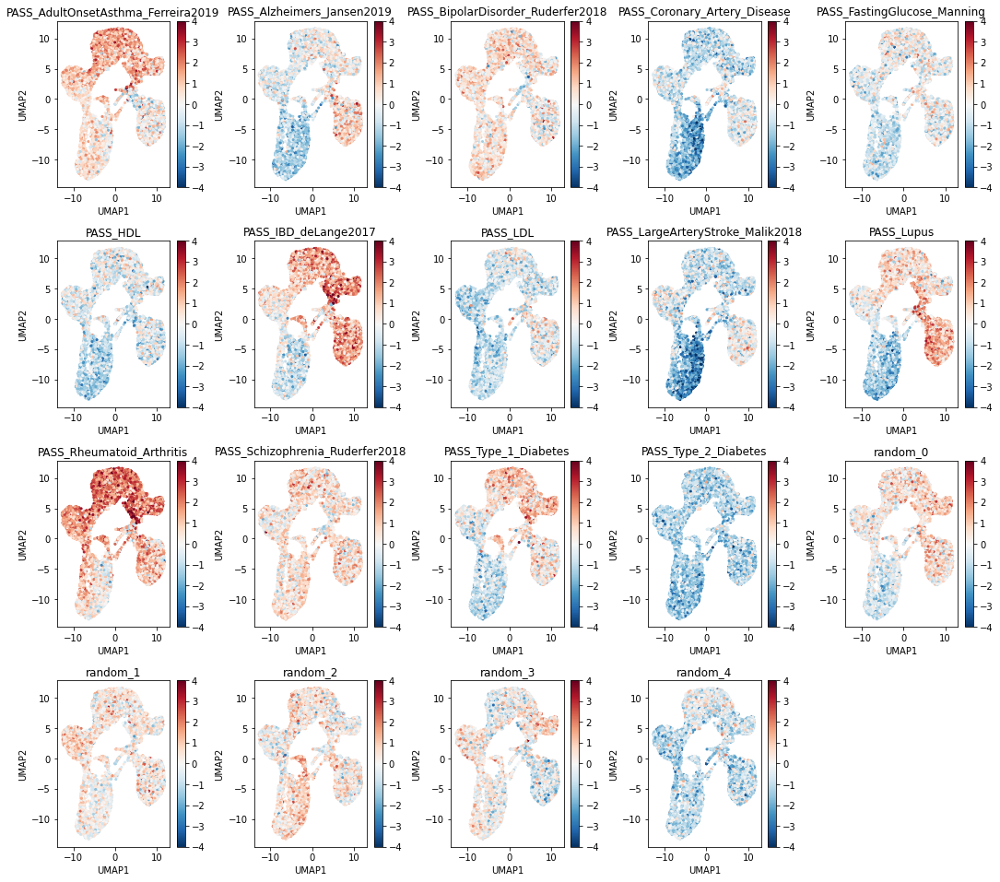

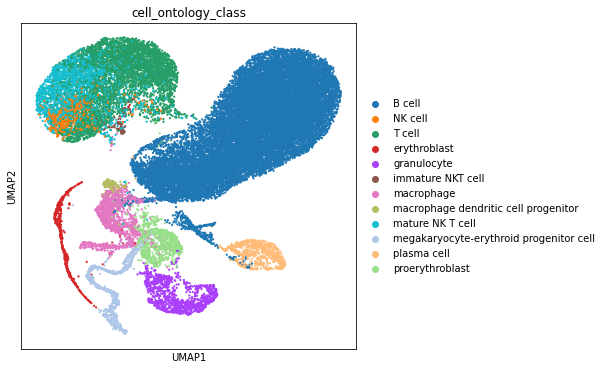

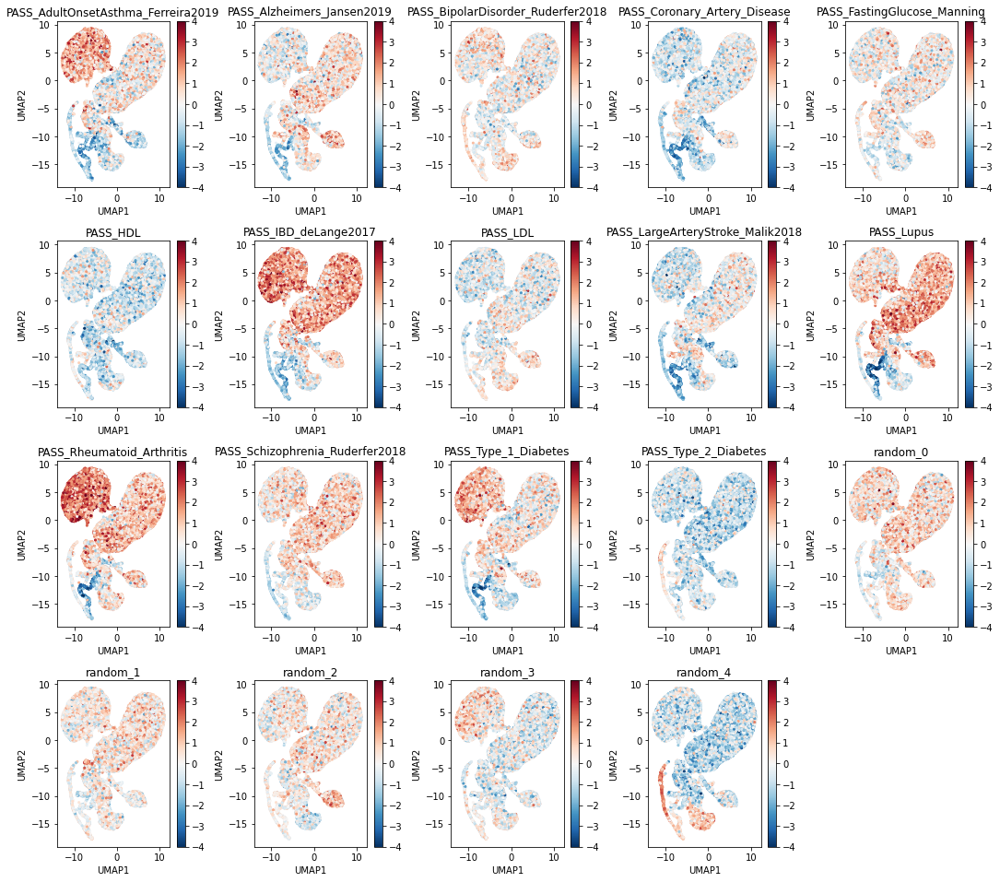

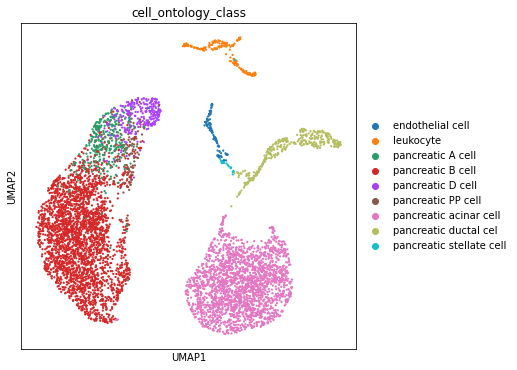

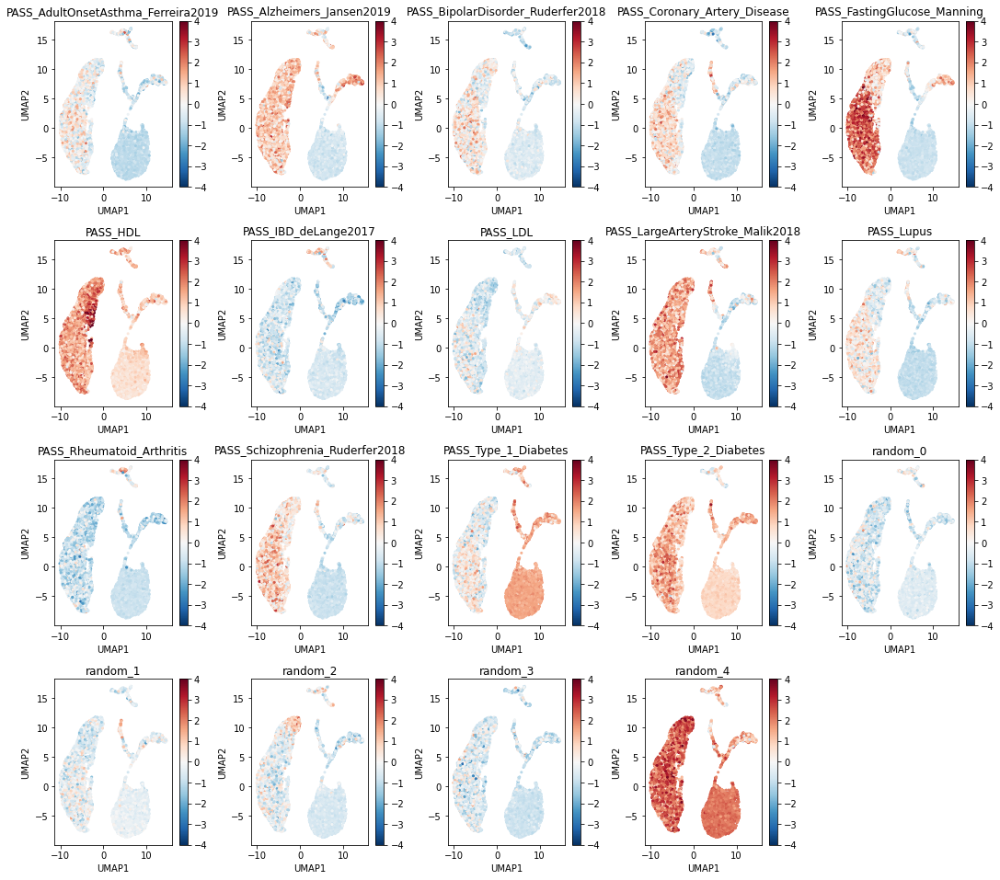

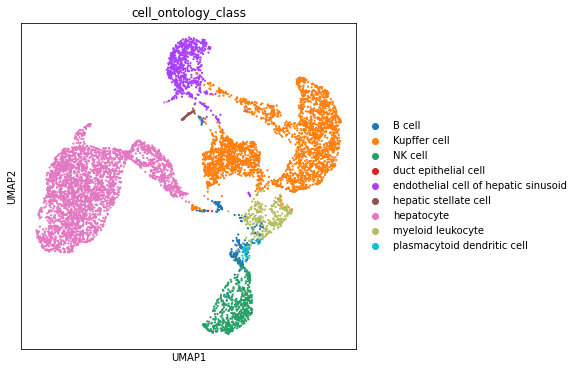

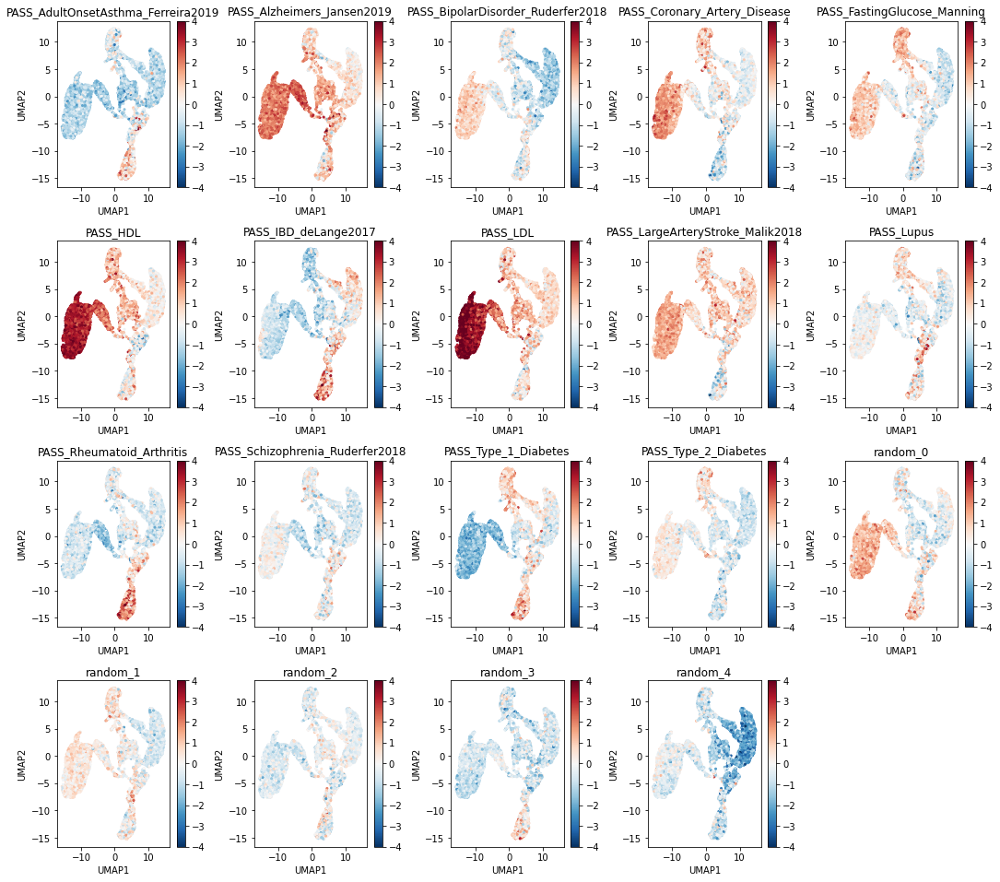

### normal_trait_ep, 500

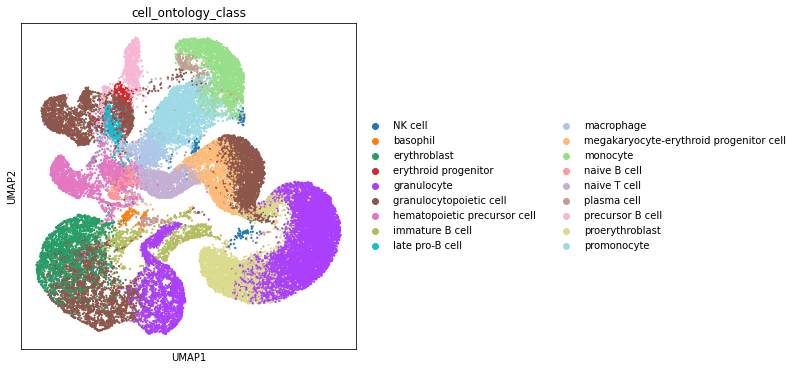

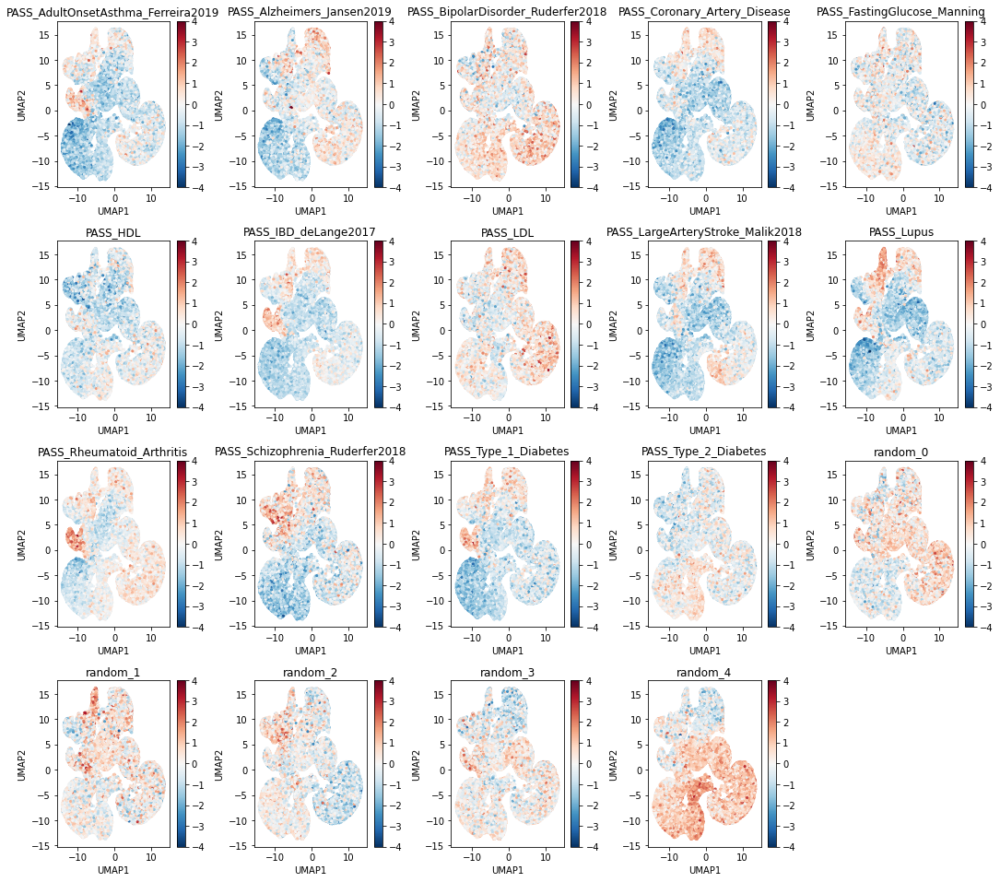

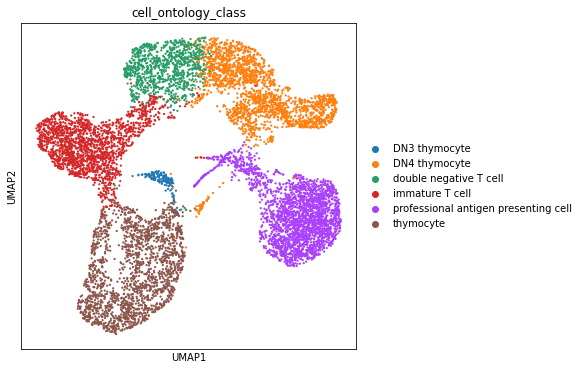

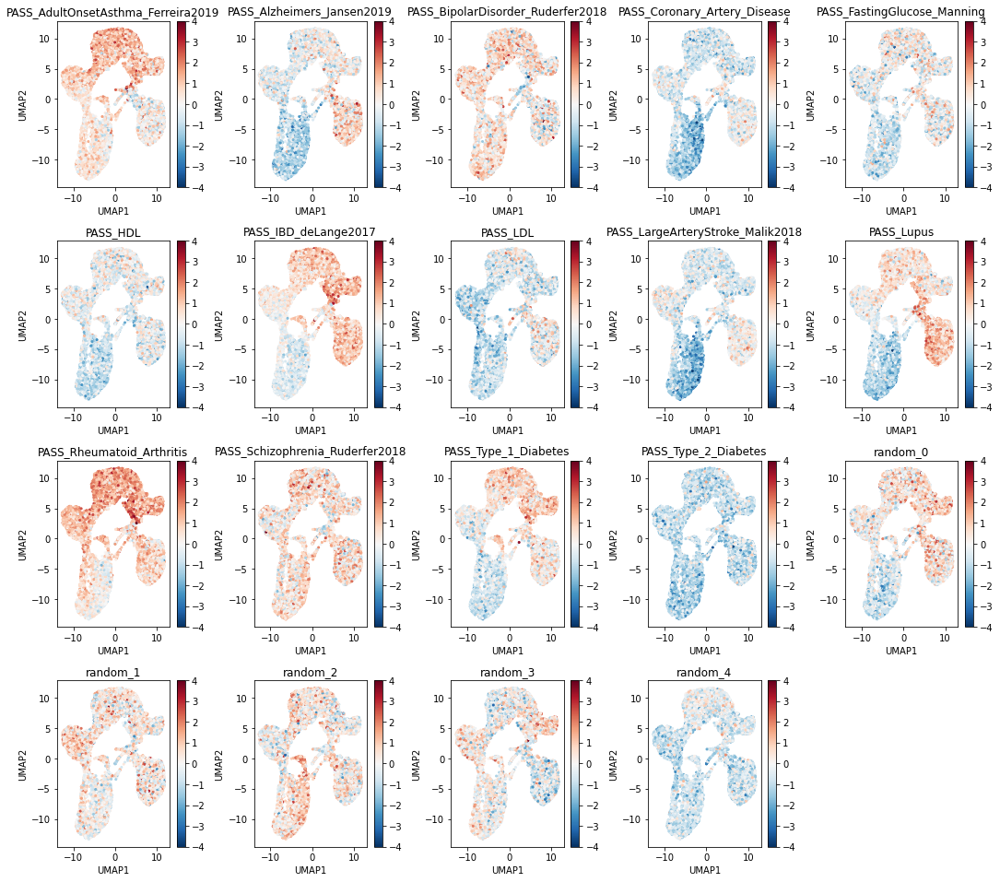

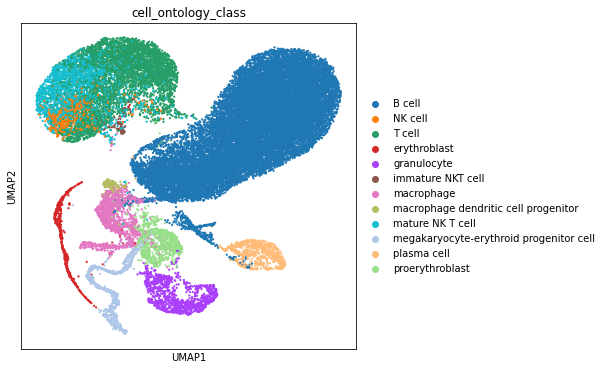

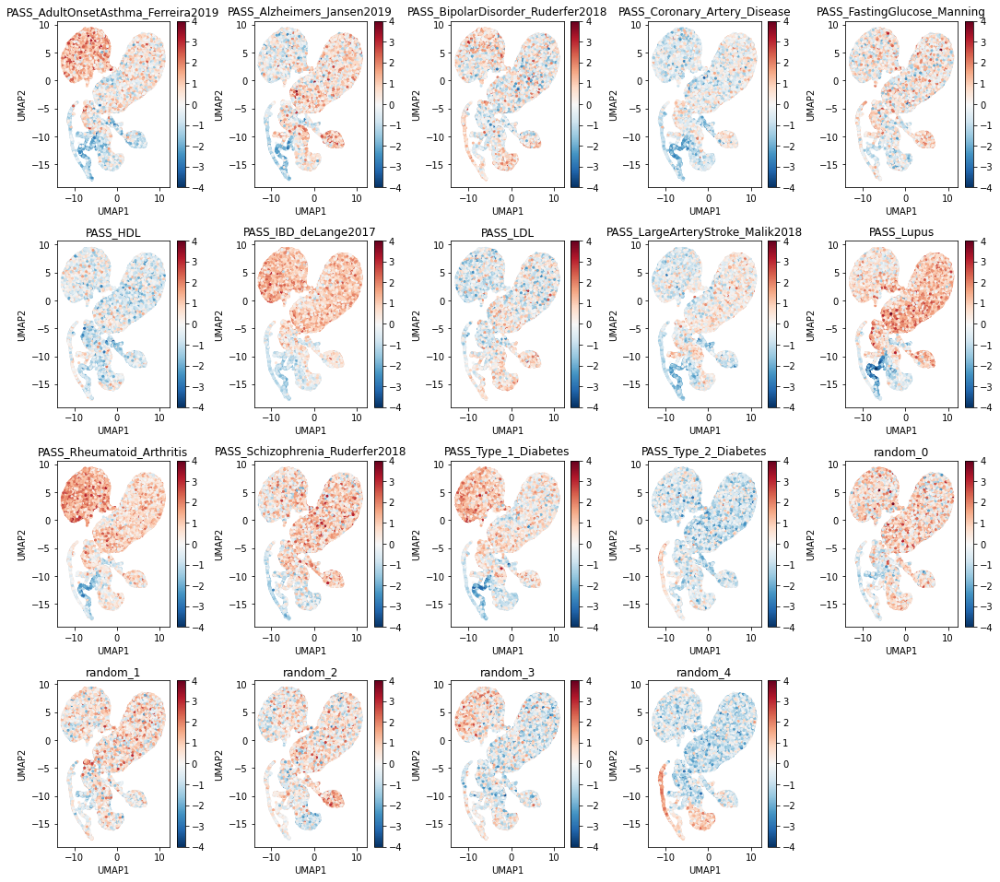

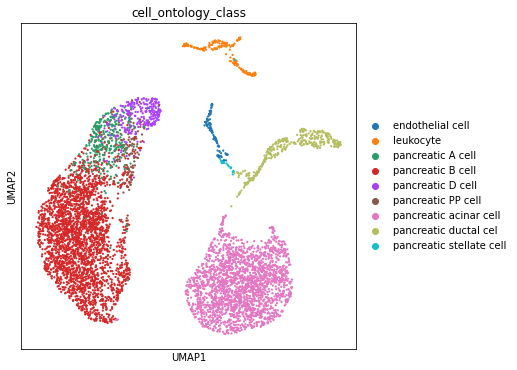

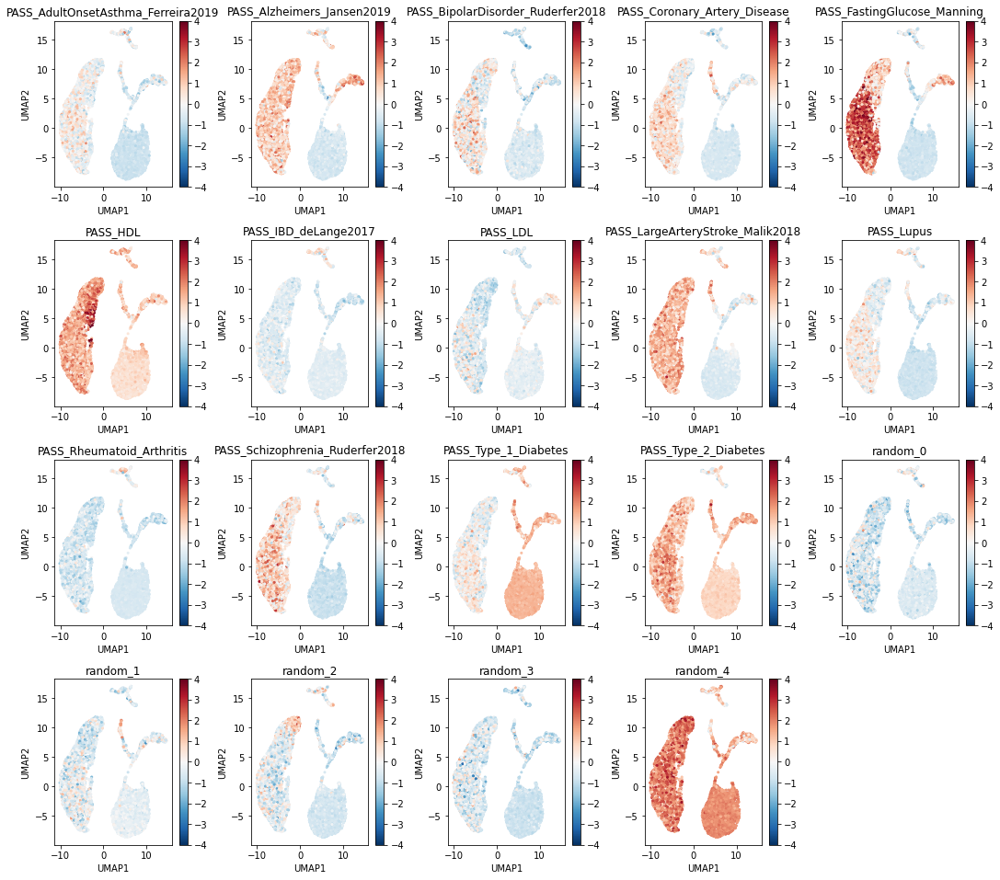

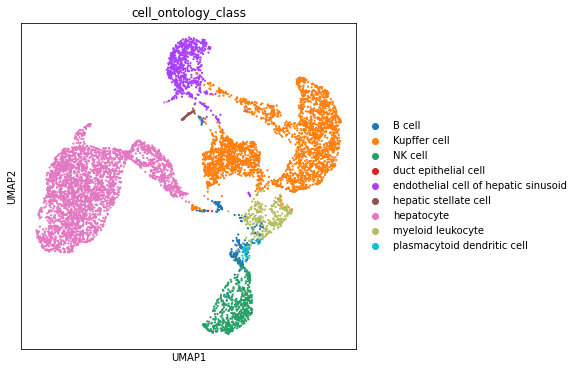

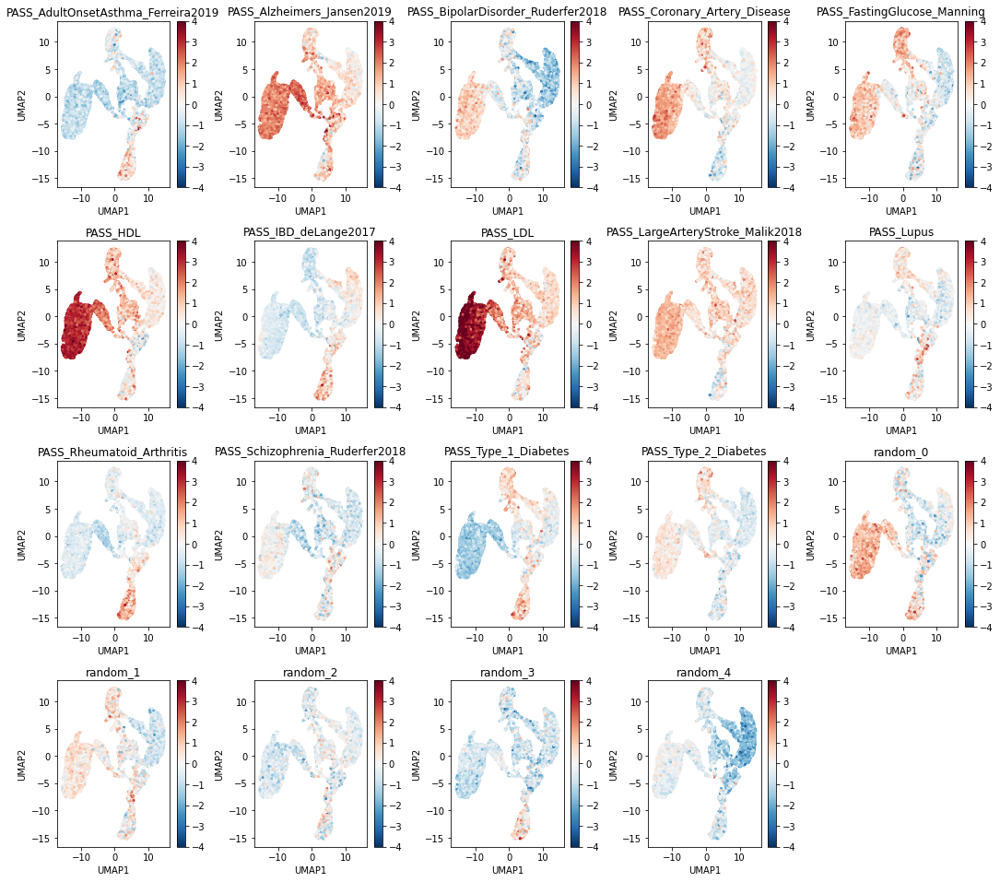

In [9]:
real_trait_names = list(np.unique([trait[0] for trait in result_dict.keys() if not trait[0].startswith('random')]))
score_index = result_dict[('random_0', 100)]['index']

for opt in ['trait_ep', 'normal_trait_ep']:
    for num_ctrl in [500]:
        display(Markdown(f'### {opt}, {num_ctrl}'))
        pval_dict = {trait: result_dict[(trait, num_ctrl)][opt] for trait in [*real_trait_names, *[f'random_{i}' for i in range(5)] ]}
        simple_md.plot_pval_umap(pval_dict, score_index, umap_adata_dict)

# TRS correlation analysis 

### trait_ep, 500

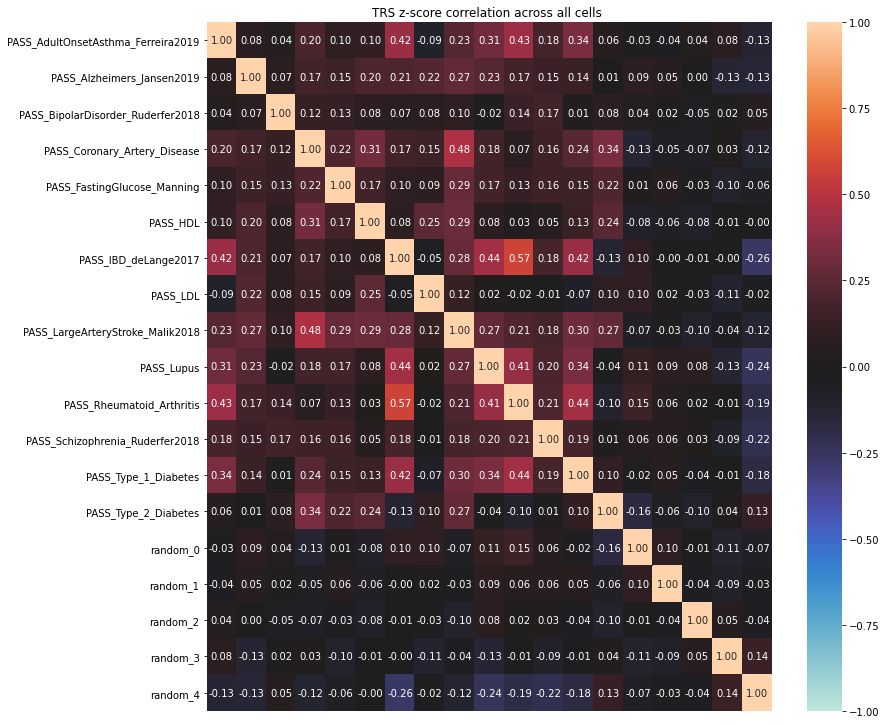

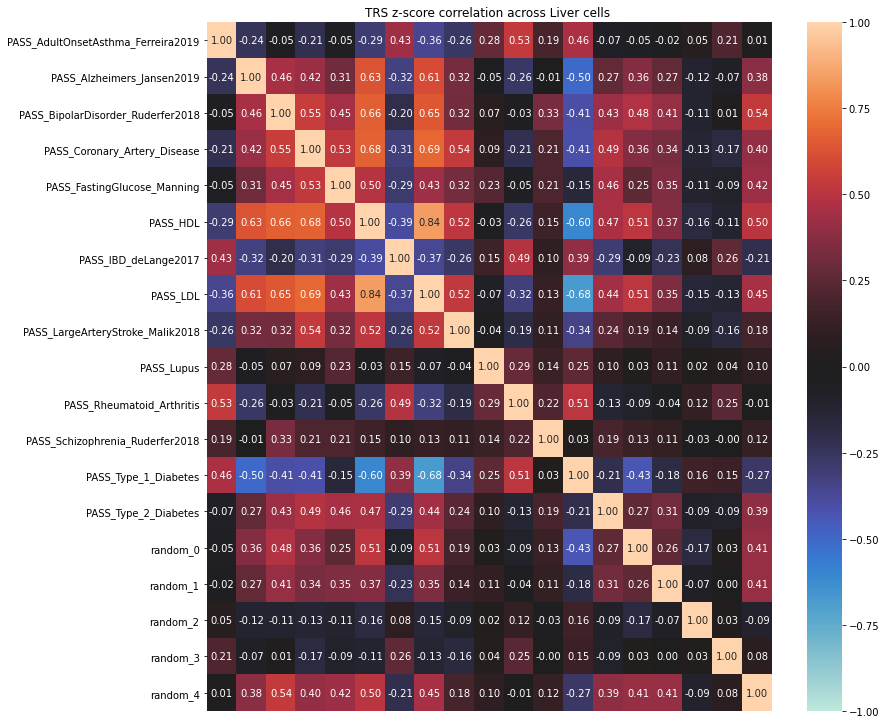

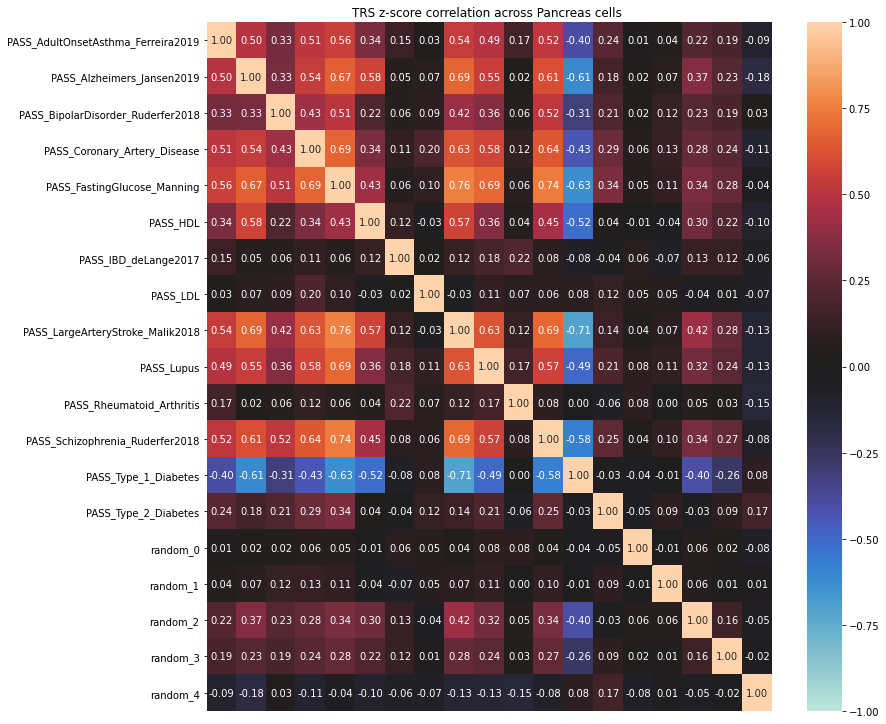

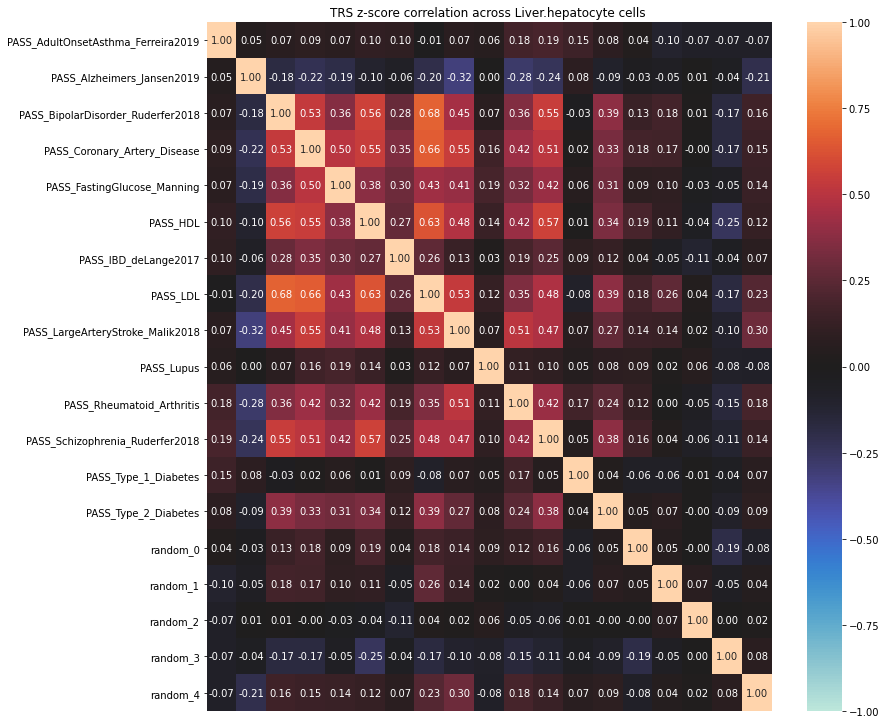

### within_tissue_trait_ep, 500

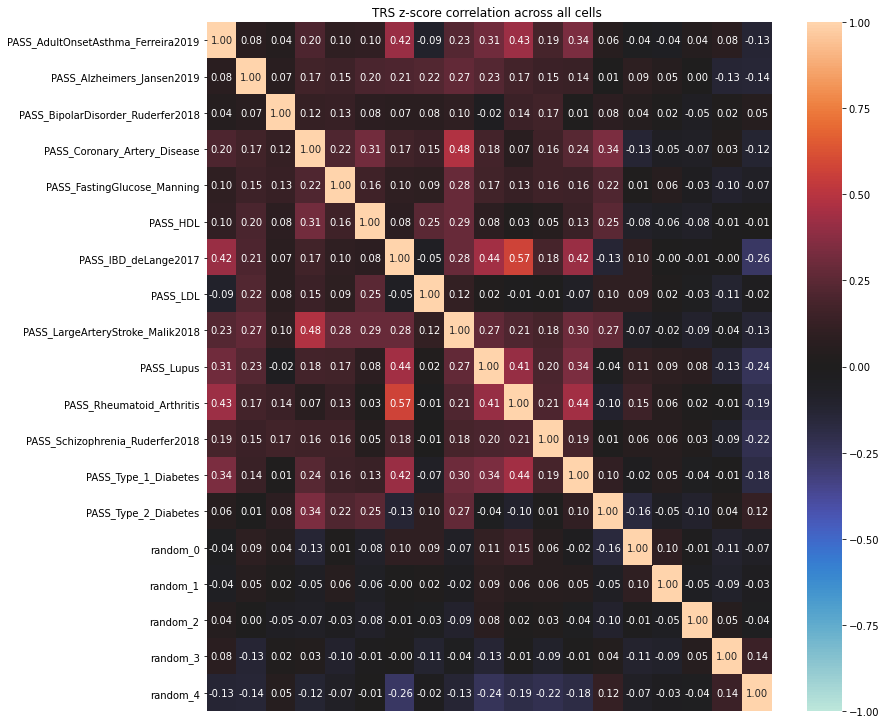

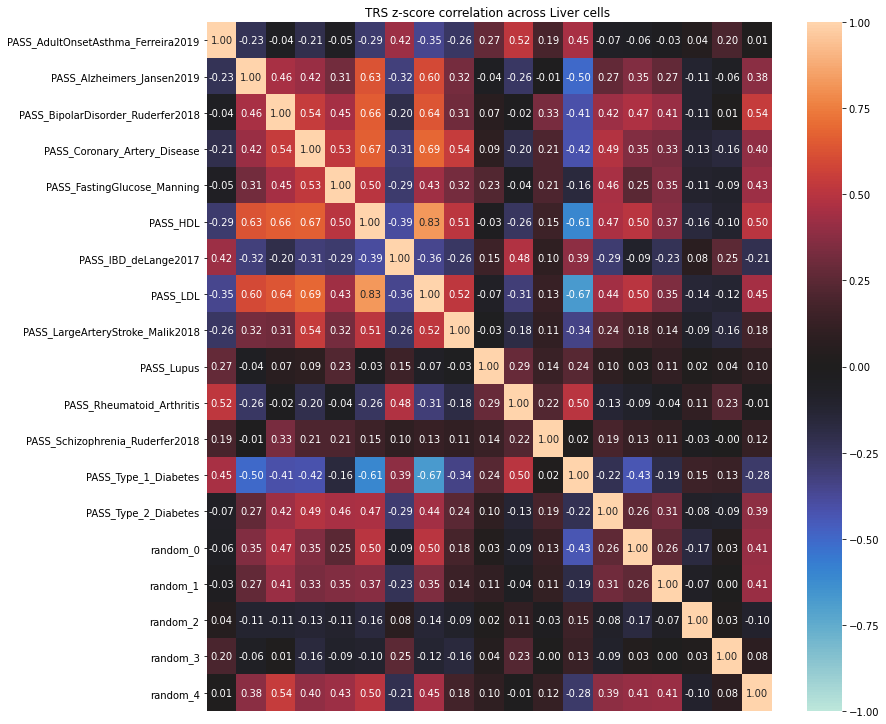

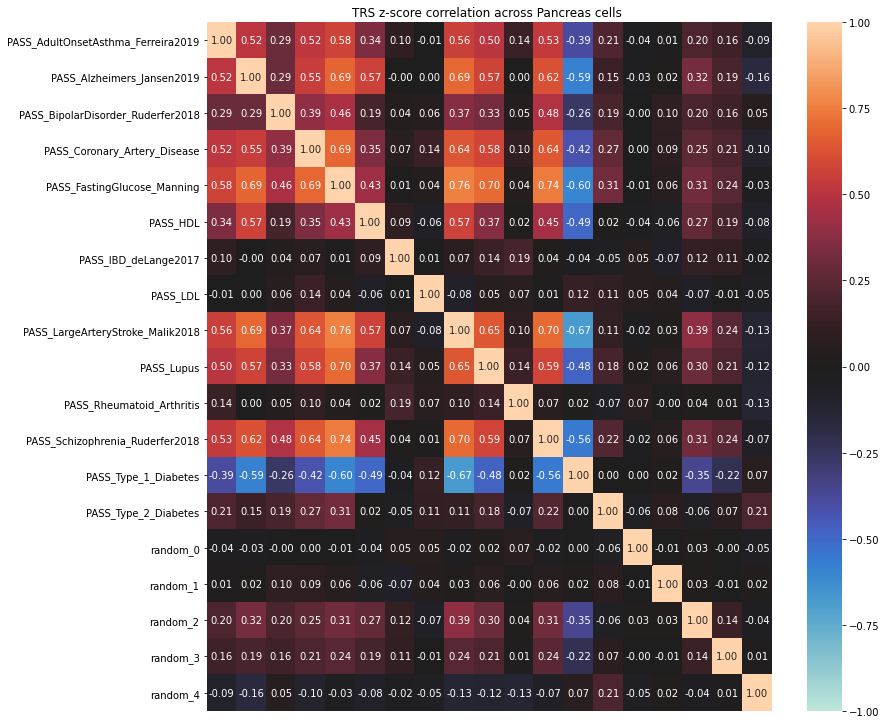

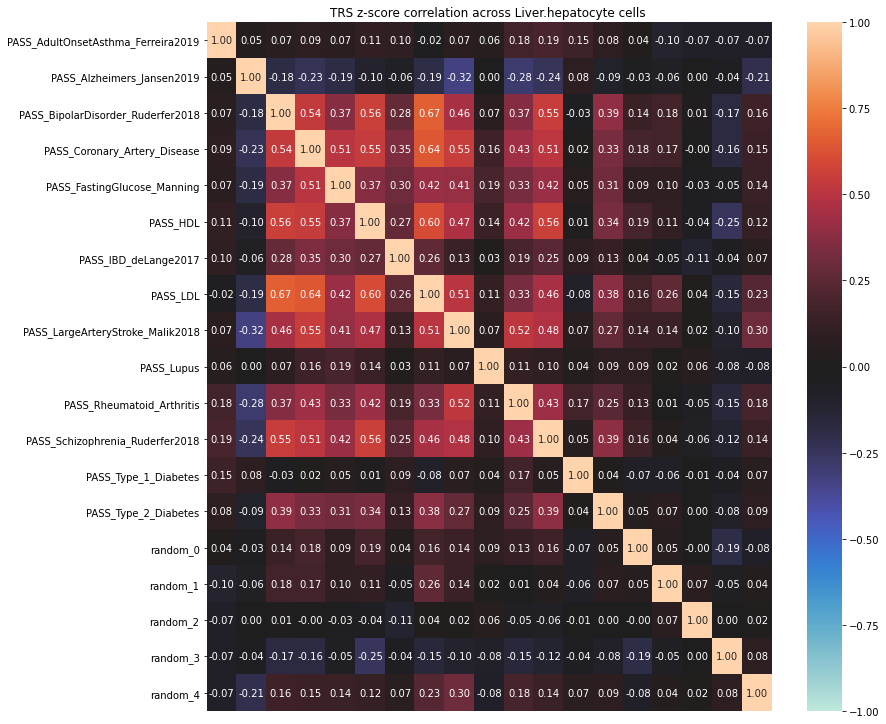

### normal_trait_ep, 500

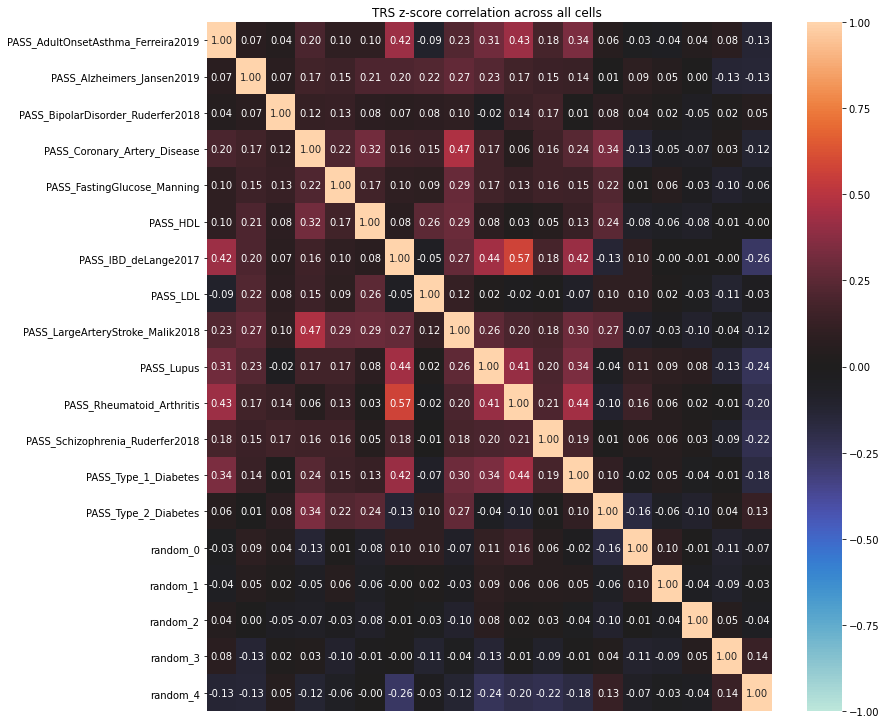

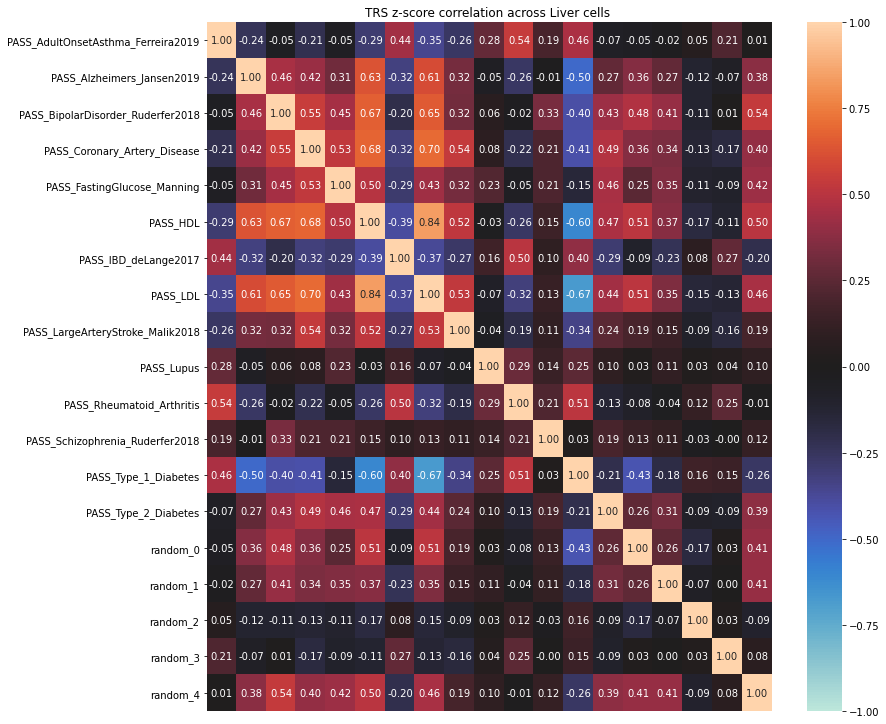

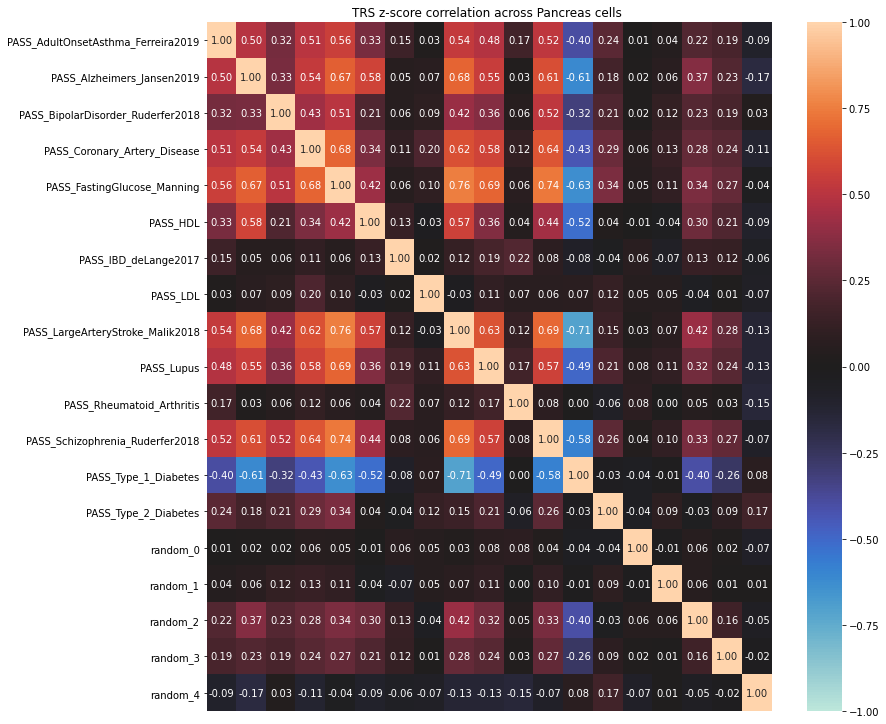

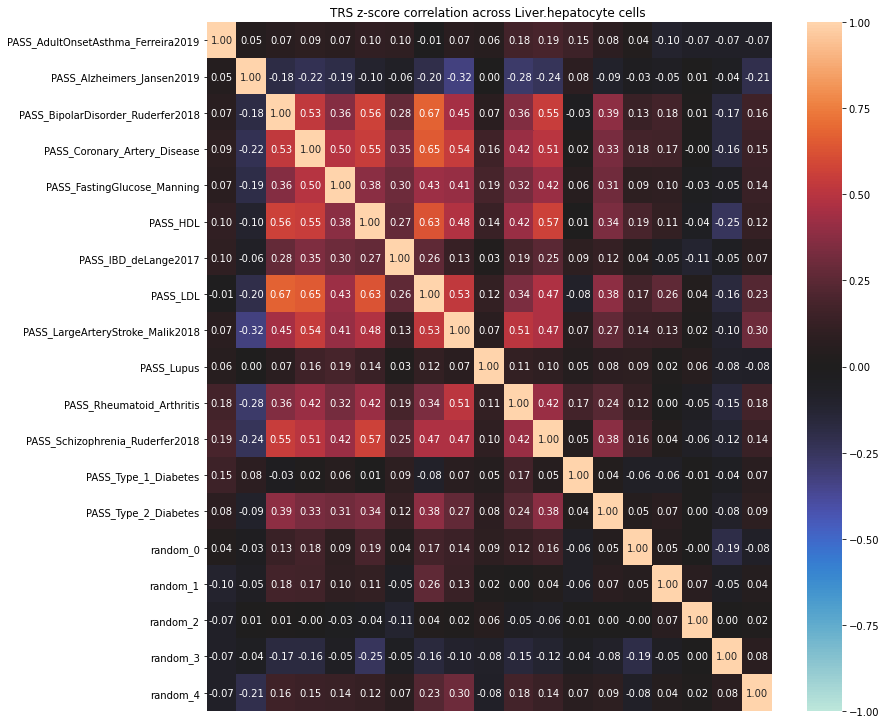

In [11]:
real_trait_names = list(np.unique([trait[0] for trait in result_dict.keys() if not trait[0].startswith('random')]))
plot_trait_names = [*real_trait_names, *[f'random_{i}' for i in range(5)]]
score_index = result_dict[('random_0', 100)]['index']


for opt in ['trait_ep', 'within_tissue_trait_ep', 'normal_trait_ep']:
    for num_ctrl in [500]:
        display(Markdown(f'### {opt}, {num_ctrl}'))
        zsc_dict = {trait: simple_md.pval2zsc(result_dict[(trait, num_ctrl)][opt]) for trait in plot_trait_names}
        simple_md.plot_score_correlation(zsc_dict, score_index, score_dataset, {'all': True, 'tissue': ['Liver', 'Pancreas'], 'tissue_celltype': ['Liver.hepatocyte']})